<a href="https://colab.research.google.com/github/Ecesu893/Tasarim2/blob/main/EfficientAug.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
import torch
import torch.nn as nn
from torchvision import datasets, transforms, models
from torch.utils.data import DataLoader, Subset, WeightedRandomSampler
from sklearn.model_selection import train_test_split
from sklearn.metrics import (accuracy_score, classification_report,
                              confusion_matrix, precision_score,
                              recall_score, f1_score)
import numpy as np
import shutil, os, json, zipfile
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
from google.colab import files
from collections import Counter
from PIL import Image

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print("🖥️  Kullanılan cihaz:", device)

🖥️  Kullanılan cihaz: cuda


In [3]:
from google.colab import drive
drive.mount('/content/drive', force_remount=True)

import shutil

# Drive'daki klasör yolu
DRIVE_AUG = "/content/drive/MyDrive/augmented_dataset"

# Colab'a kopyala
if os.path.exists("/content/augmented_dataset"):
    shutil.rmtree("/content/augmented_dataset")

shutil.copytree(DRIVE_AUG, "/content/augmented_dataset")
print("✅ augmented_dataset kopyalandı.")

AUG_DIR = "/content/augmented_dataset"
CLASSES = ["Disease-Downy", "Disease-Powdery", "Healthy", "Insect-Pest"]

print("\n📊 Augmented Sınıf Dağılımı:")
total = 0
for cls in CLASSES:
    p = os.path.join(AUG_DIR, cls)
    if os.path.exists(p):
        n = len(os.listdir(p))
        print(f"  {cls:<22}: {n} görsel")
        total += n
    else:
        print(f"  ❌ {cls} bulunamadı!")
print(f"  {'TOPLAM':<22}: {total} görsel")

Mounted at /content/drive
✅ augmented_dataset kopyalandı.

📊 Augmented Sınıf Dağılımı:
  Disease-Downy         : 1056 görsel
  Disease-Powdery       : 1056 görsel
  Healthy               : 1056 görsel
  Insect-Pest           : 1056 görsel
  TOPLAM                : 4224 görsel


  ✅ Disease-Downy         : 100_orig.jpg seçildi
  ✅ Disease-Powdery       : 100_orig.jpg seçildi
  ✅ Healthy               : 100_orig.jpg seçildi
  ✅ Insect-Pest           : 100_orig.jpg seçildi


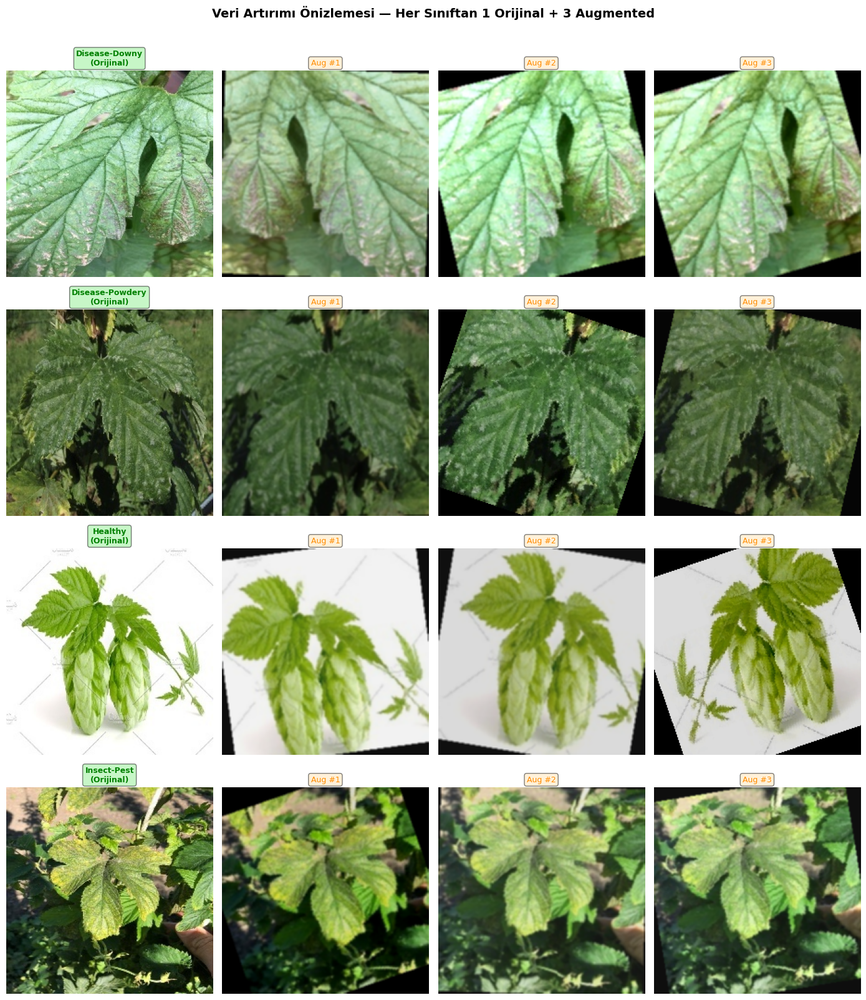

💾 augmented_samples_preview.png kaydedildi.


In [4]:
transform_aug_save = transforms.Compose([
    transforms.Resize((256, 256)),
    transforms.RandomCrop(224),
    transforms.RandomHorizontalFlip(p=0.5),
    transforms.RandomRotation(degrees=20),
    transforms.ColorJitter(brightness=0.2, contrast=0.2,
                           saturation=0.1, hue=0.05),
    transforms.GaussianBlur(kernel_size=3, sigma=(0.1, 1.5)),
])

PREVIEW_COUNT = 3

fig, axes = plt.subplots(len(CLASSES), PREVIEW_COUNT + 1,
                          figsize=(14, 4 * len(CLASSES)))

for row, class_name in enumerate(CLASSES):
    aug_dir    = os.path.join(AUG_DIR, class_name)
    all_files  = sorted(os.listdir(aug_dir))
    orig_files = [f for f in all_files if f.endswith('_orig.jpg')]

    if not orig_files:
        for col in range(PREVIEW_COUNT + 1):
            axes[row][col].axis('off')
        continue

    chosen_orig = orig_files[0]
    orig_img    = Image.open(os.path.join(aug_dir, chosen_orig)).convert("RGB")
    print(f"  ✅ {class_name:<22}: {chosen_orig} seçildi")

    axes[row][0].imshow(orig_img)
    axes[row][0].axis('off')
    axes[row][0].set_title(
        f"{class_name}\n(Orijinal)",
        fontsize=9, weight='bold', color='green',
        bbox=dict(boxstyle='round,pad=0.3',
                  facecolor='lightgreen', alpha=0.5))

    for col in range(1, PREVIEW_COUNT + 1):
        aug_img = transform_aug_save(orig_img)
        axes[row][col].imshow(aug_img)
        axes[row][col].axis('off')
        axes[row][col].set_title(
            f"Aug #{col}",
            fontsize=9, color='darkorange',
            bbox=dict(boxstyle='round,pad=0.3',
                      facecolor='moccasin', alpha=0.5))

plt.suptitle("Veri Artırımı Önizlemesi — Her Sınıftan 1 Orijinal + 3 Augmented",
             fontsize=14, weight='bold', y=1.01)
plt.tight_layout()
plt.savefig('/content/augmented_samples_preview.png', dpi=150, bbox_inches='tight')
plt.show()
print("💾 augmented_samples_preview.png kaydedildi.")

In [5]:
transform_train = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406],
                         std=[0.229, 0.224, 0.225])
])

transform_test = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406],
                         std=[0.229, 0.224, 0.225])
])

dataset_train_full = datasets.ImageFolder(root=AUG_DIR, transform=transform_train)
dataset_test_full  = datasets.ImageFolder(root=AUG_DIR, transform=transform_test)

CLASS_NAMES = dataset_train_full.classes
NUM_CLASSES = len(CLASS_NAMES)

print(f"📂 Sınıflar : {CLASS_NAMES}")
print(f"📊 Toplam   : {len(dataset_train_full)}")

all_indices = list(range(len(dataset_train_full)))
all_labels  = [dataset_train_full.samples[i][1] for i in all_indices]

train_indices, test_indices = train_test_split(
    all_indices,
    test_size=0.3,
    random_state=42,
    stratify=all_labels
)

train_set = Subset(dataset_train_full, train_indices)
test_set  = Subset(dataset_test_full,  test_indices)

train_labels = [all_labels[i] for i in train_indices]
class_counts = Counter(train_labels)
weights      = [1.0 / class_counts[all_labels[i]] for i in train_indices]
sampler      = WeightedRandomSampler(weights, len(weights), replacement=True)

train_loader = DataLoader(train_set, batch_size=32, sampler=sampler)
test_loader  = DataLoader(test_set,  batch_size=16, shuffle=False)

print(f"\n✅ Train: {len(train_indices)} | Test: {len(test_indices)}")

print("\nTrain sınıf dağılımı:")
for idx, cname in enumerate(CLASS_NAMES):
    print(f"  {cname:<22}: {Counter(train_labels)[idx]}")

print("\nTest sınıf dağılımı:")
test_labels = [all_labels[i] for i in test_indices]
for idx, cname in enumerate(CLASS_NAMES):
    print(f"  {cname:<22}: {Counter(test_labels)[idx]}")

📂 Sınıflar : ['Disease-Downy', 'Disease-Powdery', 'Healthy', 'Insect-Pest']
📊 Toplam   : 4224

✅ Train: 2956 | Test: 1268

Train sınıf dağılımı:
  Disease-Downy         : 739
  Disease-Powdery       : 739
  Healthy               : 739
  Insect-Pest           : 739

Test sınıf dağılımı:
  Disease-Downy         : 317
  Disease-Powdery       : 317
  Healthy               : 317
  Insect-Pest           : 317


In [6]:
model = models.efficientnet_b0(weights=models.EfficientNet_B0_Weights.IMAGENET1K_V1)
model.classifier[1] = nn.Linear(model.classifier[1].in_features, NUM_CLASSES)
model = model.to(device)

criterion = nn.CrossEntropyLoss()
optimizer = torch.optim.Adam(model.parameters(), lr=1e-4)
scheduler = torch.optim.lr_scheduler.StepLR(optimizer, step_size=7, gamma=0.1)

EPOCHS  = 15
history = {'loss': [], 'acc': []}

print("🚀 EfficientNet-B0 [Aug] eğitimi başlıyor...\n")

for epoch in range(EPOCHS):
    model.train()
    running_loss, correct, total = 0, 0, 0

    for batch_idx, (images, labels) in enumerate(train_loader):
        images, labels = images.to(device), labels.to(device)
        optimizer.zero_grad()
        outputs = model(images)
        loss    = criterion(outputs, labels)
        loss.backward()
        optimizer.step()

        running_loss += loss.item()
        _, predicted  = torch.max(outputs.data, 1)
        total         += labels.size(0)
        correct       += (predicted == labels).sum().item()

        if (batch_idx + 1) % 10 == 0:
            print(f"  Epoch [{epoch+1}/{EPOCHS}] "
                  f"Batch [{batch_idx+1}/{len(train_loader)}] "
                  f"Loss: {loss.item():.4f}")

    epoch_loss = running_loss / len(train_loader)
    epoch_acc  = 100 * correct / total
    history['loss'].append(epoch_loss)
    history['acc'].append(epoch_acc)
    scheduler.step()
    print(f"✅ Epoch {epoch+1}/{EPOCHS} — Loss: {epoch_loss:.4f}, Acc: {epoch_acc:.2f}%")

print("\n🎉 Eğitim tamamlandı!")

Downloading: "https://download.pytorch.org/models/efficientnet_b0_rwightman-7f5810bc.pth" to /root/.cache/torch/hub/checkpoints/efficientnet_b0_rwightman-7f5810bc.pth


100%|██████████| 20.5M/20.5M [00:00<00:00, 169MB/s]


🚀 EfficientNet-B0 [Aug] eğitimi başlıyor...

  Epoch [1/15] Batch [10/93] Loss: 1.3336
  Epoch [1/15] Batch [20/93] Loss: 1.2501
  Epoch [1/15] Batch [30/93] Loss: 1.0626
  Epoch [1/15] Batch [40/93] Loss: 1.0921
  Epoch [1/15] Batch [50/93] Loss: 0.8702
  Epoch [1/15] Batch [60/93] Loss: 0.8271
  Epoch [1/15] Batch [70/93] Loss: 0.6117
  Epoch [1/15] Batch [80/93] Loss: 0.7348
  Epoch [1/15] Batch [90/93] Loss: 0.6523
✅ Epoch 1/15 — Loss: 1.0016, Acc: 62.86%
  Epoch [2/15] Batch [10/93] Loss: 0.6571
  Epoch [2/15] Batch [20/93] Loss: 0.4513
  Epoch [2/15] Batch [30/93] Loss: 0.4130
  Epoch [2/15] Batch [40/93] Loss: 0.4385
  Epoch [2/15] Batch [50/93] Loss: 0.6581
  Epoch [2/15] Batch [60/93] Loss: 0.3189
  Epoch [2/15] Batch [70/93] Loss: 0.4065
  Epoch [2/15] Batch [80/93] Loss: 0.2595
  Epoch [2/15] Batch [90/93] Loss: 0.3338
✅ Epoch 2/15 — Loss: 0.4948, Acc: 84.13%
  Epoch [3/15] Batch [10/93] Loss: 0.5534
  Epoch [3/15] Batch [20/93] Loss: 0.3237
  Epoch [3/15] Batch [30/93] Loss

In [7]:
model.eval()
all_preds, all_labels_test = [], []

with torch.no_grad():
    for images, labels in test_loader:
        images, labels = images.to(device), labels.to(device)
        outputs = model(images)
        _, preds = torch.max(outputs, 1)
        all_preds.extend(preds.cpu().numpy())
        all_labels_test.extend(labels.cpu().numpy())

accuracy  = accuracy_score(all_labels_test, all_preds)
precision = precision_score(all_labels_test, all_preds, average='weighted', zero_division=0)
recall    = recall_score(all_labels_test, all_preds, average='weighted', zero_division=0)
f1        = f1_score(all_labels_test, all_preds, average='weighted', zero_division=0)
f1_per    = f1_score(all_labels_test, all_preds, average=None,
                     labels=list(range(NUM_CLASSES)), zero_division=0)
cm        = confusion_matrix(all_labels_test, all_preds)

print(f"{'='*60}")
print(f"📊 EfficientNet-B0 [Aug] Test Sonuçları")
print(f"{'='*60}")
print(f"🎯 Accuracy : {accuracy*100:.2f}%")
print(f"🎯 Precision: {precision*100:.2f}%")
print(f"🎯 Recall   : {recall*100:.2f}%")
print(f"🎯 F1-Score : {f1*100:.2f}%")
print(f"\n📋 Classification Report:")
print(classification_report(all_labels_test, all_preds,
                            target_names=CLASS_NAMES, zero_division=0))
print(f"🔢 Confusion Matrix:\n{cm}")
print(f"{'='*60}")

results = {
    'model'       : 'EfficientNet-B0',
    'augmentation': True,
    'accuracy'    : accuracy,
    'precision'   : precision,
    'recall'      : recall,
    'f1'          : f1,
    'f1_per_class': f1_per.tolist(),
    'class_names' : CLASS_NAMES
}
with open('/content/results_efficientnet_aug.json', 'w') as f:
    json.dump(results, f)
print("\n💾 results_efficientnet_aug.json kaydedildi.")

📊 EfficientNet-B0 [Aug] Test Sonuçları
🎯 Accuracy : 96.21%
🎯 Precision: 96.25%
🎯 Recall   : 96.21%
🎯 F1-Score : 96.19%

📋 Classification Report:
                 precision    recall  f1-score   support

  Disease-Downy       0.94      0.98      0.96       317
Disease-Powdery       0.98      1.00      0.99       317
        Healthy       0.95      0.96      0.96       317
    Insect-Pest       0.97      0.91      0.94       317

       accuracy                           0.96      1268
      macro avg       0.96      0.96      0.96      1268
   weighted avg       0.96      0.96      0.96      1268

🔢 Confusion Matrix:
[[311   4   1   1]
 [  0 316   0   1]
 [  5   2 304   6]
 [ 14   0  14 289]]

💾 results_efficientnet_aug.json kaydedildi.


❌ Toplam yanlış tahmin: 48


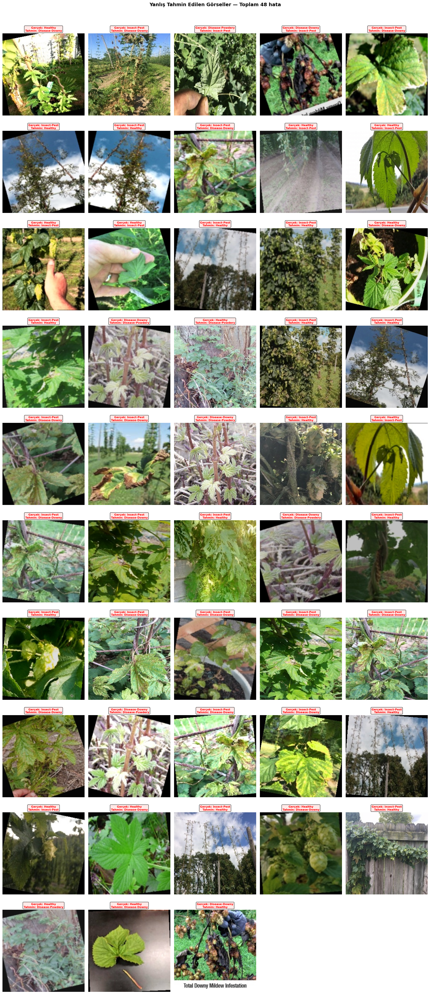

💾 wrong_predictions.png kaydedildi.

📊 Karışma Özeti:
─────────────────────────────────────────────
  Insect-Pest  →  Disease-Downy           : 14 kez
  Insect-Pest  →  Healthy                 : 14 kez
  Healthy  →  Insect-Pest                 : 6 kez
  Healthy  →  Disease-Downy               : 5 kez
  Disease-Downy  →  Disease-Powdery       : 4 kez
  Healthy  →  Disease-Powdery             : 2 kez
  Disease-Powdery  →  Insect-Pest         : 1 kez
  Disease-Downy  →  Insect-Pest           : 1 kez
  Disease-Downy  →  Healthy               : 1 kez
─────────────────────────────────────────────


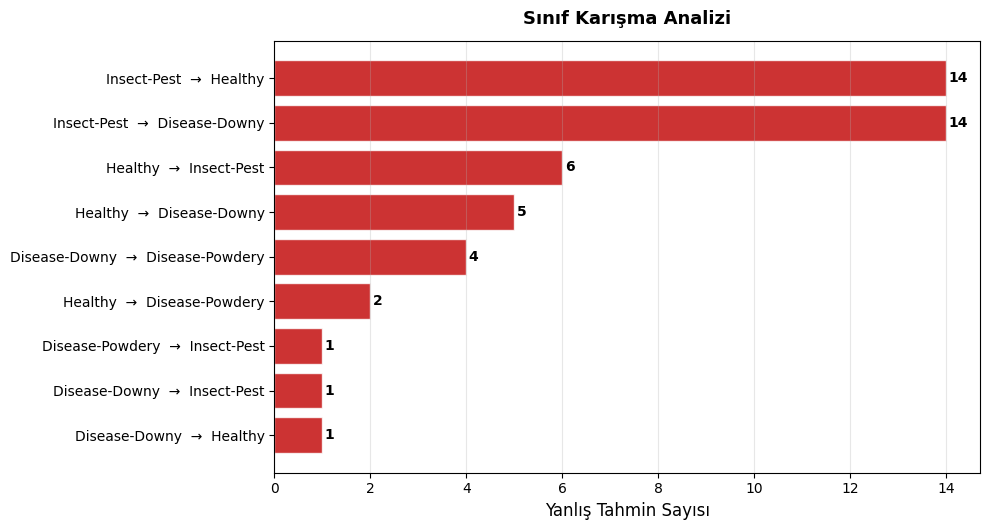

💾 confusion_pairs_chart.png kaydedildi.


In [8]:
model.eval()
wrong_images = []
wrong_true   = []
wrong_pred   = []

test_loader_single = DataLoader(test_set, batch_size=1, shuffle=False)

with torch.no_grad():
    for images, labels in test_loader_single:
        images, labels = images.to(device), labels.to(device)
        outputs = model(images)
        _, preds = torch.max(outputs, 1)

        if preds.item() != labels.item():
            img  = images.squeeze(0).cpu()
            mean = torch.tensor([0.485, 0.456, 0.406]).view(3,1,1)
            std  = torch.tensor([0.229, 0.224, 0.225]).view(3,1,1)
            img  = img * std + mean
            img  = img.permute(1, 2, 0).numpy()
            img  = np.clip(img, 0, 1)
            wrong_images.append(img)
            wrong_true.append(CLASS_NAMES[labels.item()])
            wrong_pred.append(CLASS_NAMES[preds.item()])

print(f"❌ Toplam yanlış tahmin: {len(wrong_images)}")

n_cols = 5
n_rows = max(1, (len(wrong_images) + n_cols - 1) // n_cols)

fig, axes = plt.subplots(n_rows, n_cols,
                          figsize=(n_cols * 3.5, n_rows * 4))
axes = axes.flatten()

for i, (img, true, pred) in enumerate(zip(wrong_images, wrong_true, wrong_pred)):
    axes[i].imshow(img)
    axes[i].axis('off')
    axes[i].set_title(
        f"Gerçek: {true}\nTahmin: {pred}",
        fontsize=8, weight='bold', color='red',
        bbox=dict(boxstyle='round,pad=0.3',
                  facecolor='mistyrose', alpha=0.8))

for j in range(i + 1, len(axes)):
    axes[j].axis('off')

plt.suptitle(f"Yanlış Tahmin Edilen Görseller — Toplam {len(wrong_images)} hata",
             fontsize=14, weight='bold', y=1.01)
plt.tight_layout()
plt.savefig('/content/wrong_predictions.png', dpi=150, bbox_inches='tight')
plt.show()
print("💾 wrong_predictions.png kaydedildi.")

# Karışma özeti
from collections import defaultdict
confusion_pairs = defaultdict(int)
for true, pred in zip(wrong_true, wrong_pred):
    confusion_pairs[f"{true}  →  {pred}"] += 1

print("\n📊 Karışma Özeti:")
print("─" * 45)
for pair, count in sorted(confusion_pairs.items(),
                           key=lambda x: x[1], reverse=True):
    print(f"  {pair:<40}: {count} kez")
print("─" * 45)

pairs  = list(confusion_pairs.keys())
counts = list(confusion_pairs.values())
sorted_pairs = sorted(zip(counts, pairs), reverse=True)
counts, pairs = zip(*sorted_pairs)

fig, ax = plt.subplots(figsize=(10, max(4, len(pairs) * 0.6)))
bars = ax.barh(pairs, counts, color='#C00000', alpha=0.8, edgecolor='white')
for bar, val in zip(bars, counts):
    ax.text(bar.get_width() + 0.05, bar.get_y() + bar.get_height()/2.,
            f'{val}', va='center', fontsize=10, weight='bold')
ax.set_xlabel('Yanlış Tahmin Sayısı', fontsize=12)
ax.set_title('Sınıf Karışma Analizi',
             fontsize=13, weight='bold', pad=12)
ax.grid(axis='x', alpha=0.3)
ax.invert_yaxis()
plt.tight_layout()
plt.savefig('/content/confusion_pairs_chart.png', dpi=150, bbox_inches='tight')
plt.show()
print("💾 confusion_pairs_chart.png kaydedildi.")

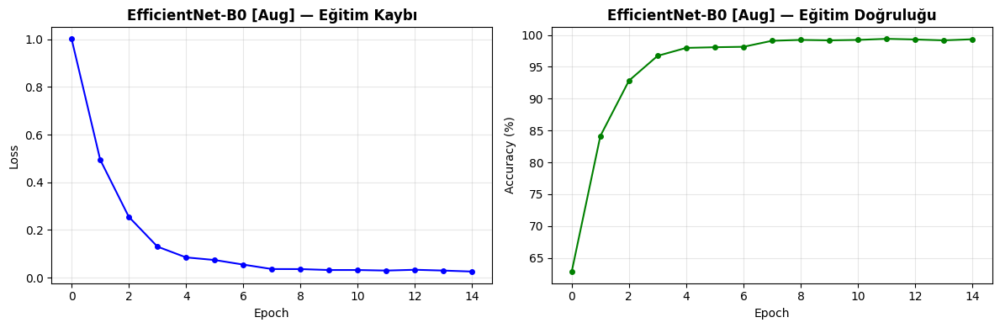

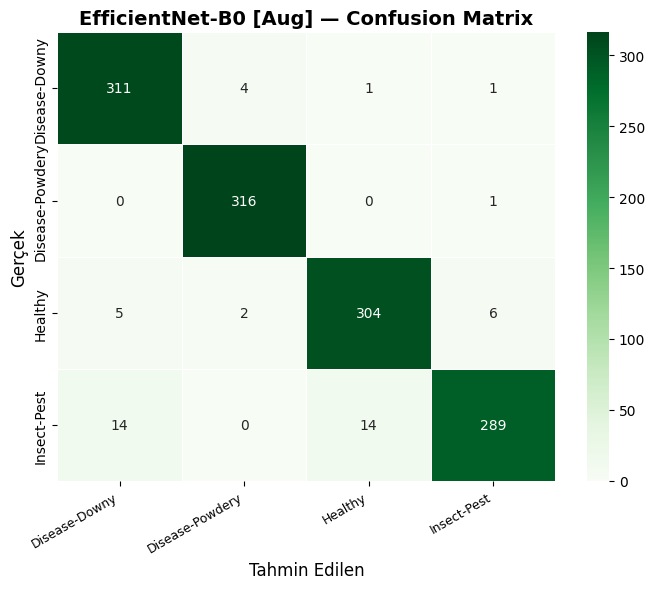

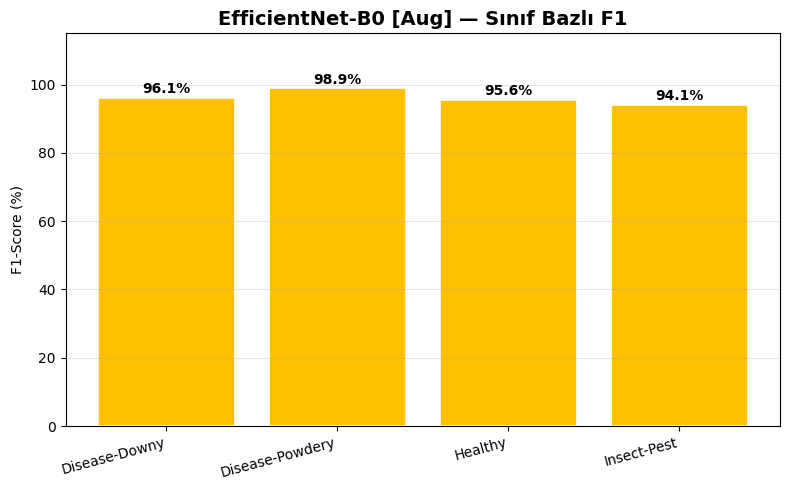

💾 Tüm görseller kaydedildi.


In [9]:
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 4))
ax1.plot(history['loss'], 'b-o', markersize=4)
ax1.set_title('EfficientNet-B0 [Aug] — Eğitim Kaybı', weight='bold')
ax1.set_xlabel('Epoch'); ax1.set_ylabel('Loss'); ax1.grid(True, alpha=0.3)
ax2.plot(history['acc'], 'g-o', markersize=4)
ax2.set_title('EfficientNet-B0 [Aug] — Eğitim Doğruluğu', weight='bold')
ax2.set_xlabel('Epoch'); ax2.set_ylabel('Accuracy (%)'); ax2.grid(True, alpha=0.3)
plt.tight_layout()
plt.savefig('/content/efficientnet_aug_history.png', dpi=150, bbox_inches='tight')
plt.show()

fig, ax = plt.subplots(figsize=(7, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Greens',
            xticklabels=CLASS_NAMES, yticklabels=CLASS_NAMES,
            linewidths=0.5, ax=ax)
ax.set_xlabel('Tahmin Edilen', fontsize=12)
ax.set_ylabel('Gerçek', fontsize=12)
ax.set_title('EfficientNet-B0 [Aug] — Confusion Matrix',
             fontsize=14, weight='bold')
plt.xticks(rotation=30, ha='right', fontsize=9)
plt.tight_layout()
plt.savefig('/content/efficientnet_aug_cm.png', dpi=150, bbox_inches='tight')
plt.show()

fig, ax = plt.subplots(figsize=(8, 5))
bars = ax.bar(CLASS_NAMES, f1_per * 100, color='#FFC000',
              edgecolor='white', linewidth=1.2)
for bar, val in zip(bars, f1_per * 100):
    ax.text(bar.get_x() + bar.get_width()/2., bar.get_height() + 0.5,
            f'{val:.1f}%', ha='center', va='bottom', fontsize=10, weight='bold')
ax.set_title('EfficientNet-B0 [Aug] — Sınıf Bazlı F1',
             fontsize=14, weight='bold')
ax.set_ylabel('F1-Score (%)')
ax.set_ylim(0, 115)
ax.grid(axis='y', alpha=0.3)
plt.xticks(rotation=15, ha='right')
plt.tight_layout()
plt.savefig('/content/efficientnet_aug_f1.png', dpi=150, bbox_inches='tight')
plt.show()
print("💾 Tüm görseller kaydedildi.")

In [10]:
torch.save(model.state_dict(), '/content/efficientnet_aug.pth')

zip_path = '/content/notebook4_efficientnet_aug.zip'
with zipfile.ZipFile(zip_path, 'w', zipfile.ZIP_DEFLATED) as zf:
    for f in ['/content/efficientnet_aug_history.png',
              '/content/efficientnet_aug_cm.png',
              '/content/efficientnet_aug_f1.png',
              '/content/augmented_samples_preview.png',
              '/content/wrong_predictions.png',
              '/content/confusion_pairs_chart.png',
              '/content/efficientnet_aug.pth',
              '/content/results_efficientnet_aug.json']:
        if os.path.exists(f):
            zf.write(f, os.path.basename(f))

files.download(zip_path)
print("✅ notebook4_efficientnet_aug.zip indirildi!")

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

✅ notebook4_efficientnet_aug.zip indirildi!
